<div class="alert alert-block alert-danger">
<b>Alert:</b> This lab uses the previous lab notebook. Please scroll down to see the current lab solution 
    Please click here to go to solution: 
</div>

[Solution 4.02](#Solution-4.02)

[Solution 4.03](#Solution-4.03)

[Solution 4.04](#Solution-4.04)

[Solution 4.05](#Solution-4.05)

## Solution 4.02
## <span style="color:#7B241C"> 1 </span>

In [2]:
# Basic libraries
import pymysql
import pandas as pd # data manipulatioN
import numpy as np # numerical operations
import matplotlib.pyplot as plt # 2D visualizations
import seaborn as sns # high-resolution visualization
import plotly.express as px #Visualization
import warnings # warning messages management

# Machine Learning
#from sklearn.preprocessing import StandardScaler
#from sklearn.preprocessing import LabelEncoder # label encoding
from sklearn.model_selection import train_test_split # splitting data into train/test sets
from sklearn.linear_model import LinearRegression # Linear Regression
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error #LR metrics
#from sklearn.linear_model import LogisticRegression # logistic model
#from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, cohen_kappa_score # logistic metrics
from sklearn.neighbors import KNeighborsRegressor #KNN
#from sklearn import metrics # more metrics

# Settings
pd.set_option('display.max_columns', None) # display all columns
warnings.filterwarnings('ignore') # ignore warnings
#%matplotlib inline


## <span style="color:#7B241C"> 2</span>

In [3]:
#Import data from the file 
customer_df=pd.read_csv("files_for_lab/we_fn_use_c_marketing_customer_value_analysis.csv",sep=",") # Paste here the path. 
customer_df.sample(10)

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
684,HX44948,Oregon,5759.910840,No,Basic,Bachelor,1/28/11,Employed,M,85448,Rural,Married,72,16,76,0,3,Special Auto,Special L2,Offer3,Agent,16.034510,Four-Door Car,Medsize
8104,IK64989,Washington,4458.113369,Yes,Basic,Bachelor,1/2/11,Retired,M,17622,Suburban,Divorced,65,1,36,1,3,Personal Auto,Personal L2,Offer1,Agent,312.000000,Four-Door Car,Medsize
1751,XM11175,Arizona,5994.424627,No,Extended,College,1/2/11,Unemployed,M,0,Suburban,Single,91,26,89,0,6,Personal Auto,Personal L1,Offer1,Web,655.200000,Four-Door Car,Small
8004,PA15141,California,6953.952351,No,Extended,High School or Below,2/27/11,Employed,F,43221,Urban,Married,87,33,51,0,7,Special Auto,Special L2,Offer1,Branch,398.735257,Four-Door Car,Large
7971,QP76867,Oregon,16152.904890,No,Basic,College,2/21/11,Unemployed,M,0,Suburban,Divorced,109,12,66,0,2,Personal Auto,Personal L3,Offer1,Agent,852.460341,Sports Car,Large
5425,IY38767,Oregon,5325.724541,Yes,Basic,High School or Below,2/21/11,Unemployed,M,0,Suburban,Married,73,17,44,0,7,Personal Auto,Personal L3,Offer2,Call Center,496.474767,Two-Door Car,Medsize
6850,PZ75671,Oregon,7223.689647,No,Extended,College,1/28/11,Unemployed,F,0,Suburban,Married,97,31,58,0,3,Personal Auto,Personal L1,Offer1,Web,465.600000,Four-Door Car,Medsize
2125,MF19231,California,7434.675149,No,Extended,Master,2/22/11,Employed,M,28377,Suburban,Married,94,26,99,0,3,Personal Auto,Personal L1,Offer2,Call Center,451.200000,Four-Door Car,Medsize
5833,AJ89108,California,11009.130490,Yes,Premium,Bachelor,1/24/11,Employed,F,51643,Suburban,Single,283,16,43,0,1,Personal Auto,Personal L3,Offer2,Agent,1358.400000,Luxury Car,Medsize
6898,MU53244,California,5095.439821,No,Extended,Bachelor,2/24/11,Unemployed,F,0,Urban,Married,137,19,30,0,1,Personal Auto,Personal L2,Offer1,Web,452.295175,SUV,Medsize


## <span style="color:#7B241C"> 3</span>

>Customer_id is not a variable that gives any information in our model. It is an unique identifier that is not usable in the machine learning model. 

In [4]:
customer_df=customer_df.drop(columns=['Customer'])

## <span style="color:#7B241C"> 4</span>

In [5]:
#Standarize column names following PE8
cols = [col_name.lower().replace(' ', '_') for col_name in customer_df.columns]
customer_df.columns = cols

In [6]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          9134 non-null   object 
 1   customer_lifetime_value        9134 non-null   float64
 2   response                       9134 non-null   object 
 3   coverage                       9134 non-null   object 
 4   education                      9134 non-null   object 
 5   effective_to_date              9134 non-null   object 
 6   employmentstatus               9134 non-null   object 
 7   gender                         9134 non-null   object 
 8   income                         9134 non-null   int64  
 9   location_code                  9134 non-null   object 
 10  marital_status                 9134 non-null   object 
 11  monthly_premium_auto           9134 non-null   int64  
 12  months_since_last_claim        9134 non-null   i

In [7]:
#Before splitting 
#Effective to date is a date, not categorical
customer_df['effective_to_date'] = pd.to_datetime(customer_df['effective_to_date'], format='%m/%d/%y')
#These two features are numerical discrete. this means like categorical ordinal
customer_df['number_of_open_complaints'] = customer_df['number_of_open_complaints'].astype('object')
customer_df['number_of_policies'] = customer_df['number_of_policies'].astype('object')
customer_df.sample(4)
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   state                          9134 non-null   object        
 1   customer_lifetime_value        9134 non-null   float64       
 2   response                       9134 non-null   object        
 3   coverage                       9134 non-null   object        
 4   education                      9134 non-null   object        
 5   effective_to_date              9134 non-null   datetime64[ns]
 6   employmentstatus               9134 non-null   object        
 7   gender                         9134 non-null   object        
 8   income                         9134 non-null   int64         
 9   location_code                  9134 non-null   object        
 10  marital_status                 9134 non-null   object        
 11  monthly_premium_a

In [8]:
#Split dataframe into numerical and categorical
numericals_df=customer_df.select_dtypes(include=["float", "int"])
categorical_df=customer_df.select_dtypes(include=[object]) 

In [9]:
numericals_df.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,total_claim_amount
0,2763.519279,56274,69,32,5,384.811147
1,6979.535903,0,94,13,42,1131.464935
2,12887.431650,48767,108,18,38,566.472247
3,7645.861827,0,106,18,65,529.881344
4,2813.692575,43836,73,12,44,138.130879


In [10]:
categorical_df.head()

,state,response,coverage,education,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,Washington,No,Basic,Bachelor,Employed,F,Suburban,Married,0,1,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,Unemployed,F,Suburban,Single,0,8,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,Employed,F,Suburban,Married,0,2,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,Unemployed,M,Suburban,Married,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,Washington,No,Basic,Bachelor,Employed,M,Rural,Single,0,1,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


## <span style="color:#7B241C"> 5</span>

**Counts**

<div class="alert alert-block alert-info">
<b>info:</b> Please scroll down to see the counts of the different categorical variables 
</div>

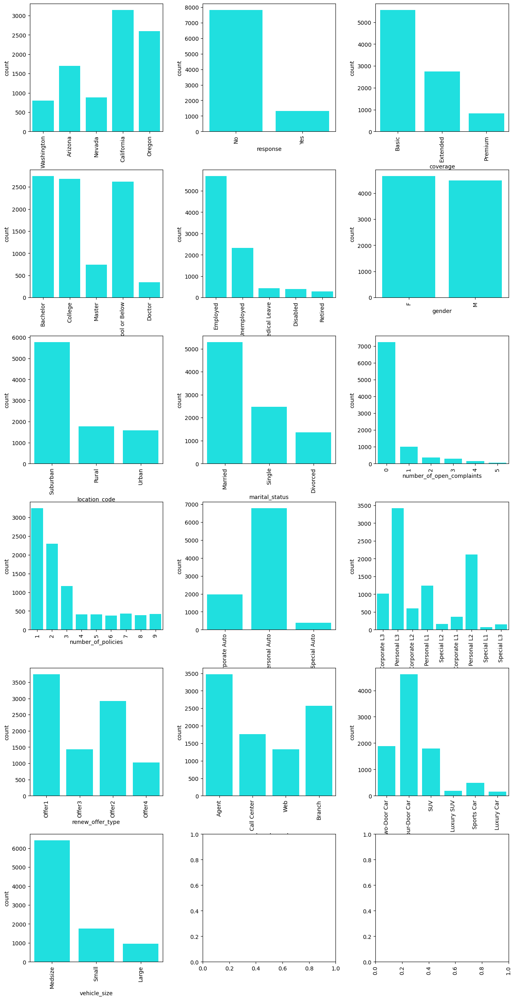

In [11]:
# determine the number of rows and columns in the plot grid
num_cols = 3  # number of columns in the grid
num_rows = (len(categorical_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
plt.xticks(rotation=90)
for i, column in enumerate(categorical_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.countplot(x=categorical_df[column], ax=axes[row_idx, col_idx], color='cyan')
    axes[row_idx, col_idx].set_xlabel(column)
    axes[row_idx, col_idx].set_xticklabels(axes[row_idx, col_idx].get_xticklabels(), rotation=90)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.show()

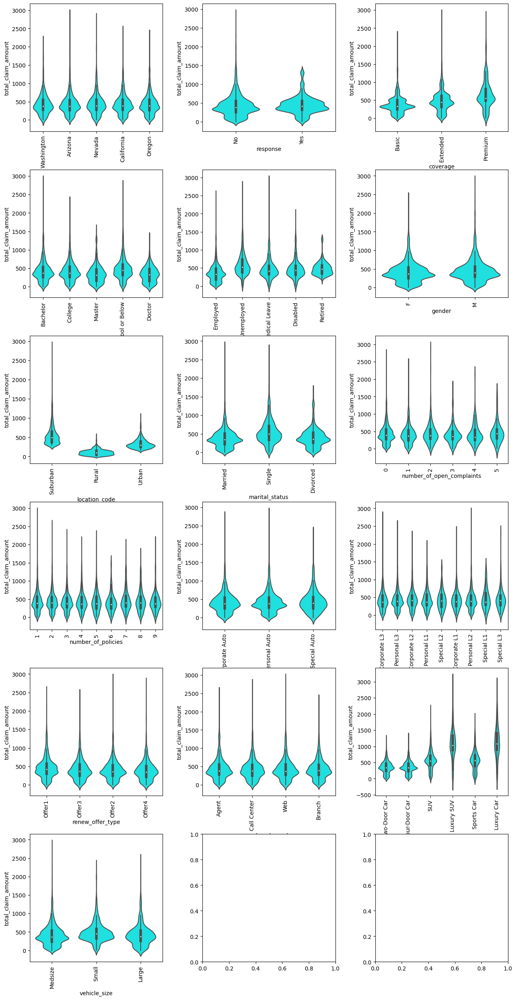

In [12]:

##violin plot
# determine the number of rows and columns in the plot grid
num_cols = 3  # number of columns in the grid
num_rows = (len(categorical_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, column in enumerate(categorical_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.violinplot(x=categorical_df[column],y='total_claim_amount', ax=axes[row_idx, col_idx],data= customer_df, color='cyan')
    axes[row_idx, col_idx].set_xlabel(column)
    axes[row_idx, col_idx].set_xticklabels(axes[row_idx, col_idx].get_xticklabels(), rotation=90)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.show()

In [ ]:
# determine the number of rows and columns in the plot grid
num_cols = 3  # number of columns in the grid
num_rows = (len(categorical_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, column in enumerate(categorical_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.boxplot(y=categorical_df[column],x='total_claim_amount', ax=axes[row_idx, col_idx],data= customer_df, color='cyan')
    axes[row_idx, col_idx].set_xlabel('total_claim_amount')
    axes[row_idx, col_idx].set_xticklabels(axes[row_idx, col_idx].get_xticklabels(), rotation=90)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.35, hspace=0.35)
plt.show()

## <span style="color:#7B241C"> 6</span>

In [13]:
#Check unique values for each categorical value
for column in categorical_df.columns:
    print('─' * 10)
    print("This feature ", '\033[1m' + column + '\033[0m' ," has ", categorical_df[column].nunique(), " categories \n The single values are: ", categorical_df[column].unique(),"\n" )
    print("Here the detail: \n" , categorical_df[column].value_counts())
    print("\n\n")

──────────
This feature  state  has  5  categories 
 The single values are:  ['Washington' 'Arizona' 'Nevada' 'California' 'Oregon'] 

Here the detail: 
 California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: state, dtype: int64



──────────
This feature  response  has  2  categories 
 The single values are:  ['No' 'Yes'] 

Here the detail: 
 No     7826
Yes    1308
Name: response, dtype: int64



──────────
This feature  coverage  has  3  categories 
 The single values are:  ['Basic' 'Extended' 'Premium'] 

Here the detail: 
 Basic       5568
Extended    2742
Premium      824
Name: coverage, dtype: int64



──────────
This feature  education  has  5  categories 
 The single values are:  ['Bachelor' 'College' 'Master' 'High School or Below' 'Doctor'] 

Here the detail: 
 Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: education, dtype: in

## Solution 4.03
<div class="alert alert-block alert-danger">
<b>Alert:</b> Here is the lab | Feature extraction starting
</div>

## <span style="color:#7B241C"> 1</span>

In [14]:
categorical_df.head()

,state,response,coverage,education,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,Washington,No,Basic,Bachelor,Employed,F,Suburban,Married,0,1,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,Unemployed,F,Suburban,Single,0,8,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,Employed,F,Suburban,Married,0,2,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,Unemployed,M,Suburban,Married,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,Washington,No,Basic,Bachelor,Employed,M,Rural,Single,0,1,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


## <span style="color:#7B241C"> 2</span>

**Counts**

<div class="alert alert-block alert-info">
<b>info:</b> Please scroll down to see the counts of the different categorical variables 
</div>

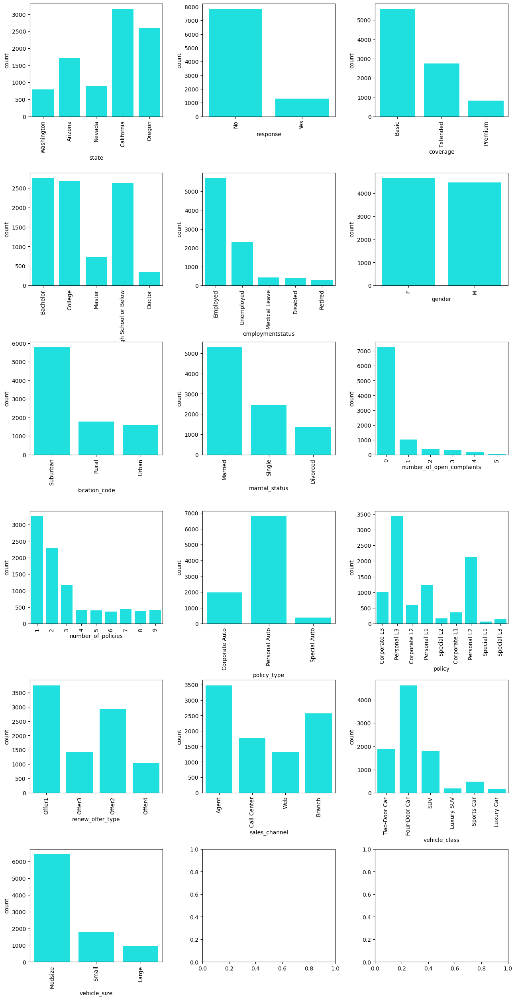

In [15]:
# determine the number of rows and columns in the plot grid
num_cols = 3  # number of columns in the grid
num_rows = (len(categorical_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
for i, column in enumerate(categorical_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.countplot(x=categorical_df[column], ax=axes[row_idx, col_idx], color='cyan')
    axes[row_idx, col_idx].set_xlabel(column)
    axes[row_idx, col_idx].set_xticklabels(axes[row_idx, col_idx].get_xticklabels(), rotation=90)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.5)
plt.show()

>Policy type and Policy are similar but policy has more granularity. Maybe is a good aidea to creaate a feature which categories are L1, L2 and L3
vehicleclass and vehilce size could be related but if we delete one I am afraid we loose the luxury categories. 

## <span style="color:#7B241C"> 3</span>

>change in Policy to a categorical value only with categories L1,L2,L3. New variable called Policy_level

In [16]:
def policy_level(x) : 
    if 'L1' in x:
        return 'L1'
    elif 'L2' in x: 
        return 'L2'
    elif 'L3' in x:
        return 'L3'

In [17]:
categorical_df['policy_level']=categorical_df['policy'].apply(policy_level)

In [18]:
categorical_df= categorical_df.drop(columns=['policy'])

In [19]:
categorical_df.head()

,state,response,coverage,education,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,sales_channel,vehicle_class,vehicle_size,policy_level
0,Washington,No,Basic,Bachelor,Employed,F,Suburban,Married,0,1,Corporate Auto,Offer1,Agent,Two-Door Car,Medsize,L3
1,Arizona,No,Extended,Bachelor,Unemployed,F,Suburban,Single,0,8,Personal Auto,Offer3,Agent,Four-Door Car,Medsize,L3
2,Nevada,No,Premium,Bachelor,Employed,F,Suburban,Married,0,2,Personal Auto,Offer1,Agent,Two-Door Car,Medsize,L3
3,California,No,Basic,Bachelor,Unemployed,M,Suburban,Married,0,7,Corporate Auto,Offer1,Call Center,SUV,Medsize,L2
4,Washington,No,Basic,Bachelor,Employed,M,Rural,Single,0,1,Personal Auto,Offer1,Agent,Four-Door Car,Medsize,L1


## <span style="color:#7B241C"> 4</span>

In [20]:
date_df=customer_df.select_dtypes(include=["datetime"])

In [21]:
date_df.head()

,effective_to_date
0,2011-02-24
1,2011-01-31
2,2011-02-19
3,2011-01-20
4,2011-02-03


In [22]:
#Count of records in each date
date_counts = date_df.squeeze().dt.date.value_counts()
fig = px.bar(x=date_counts.index, y=date_counts.values)
fig.show()

In [23]:
date_cat_df=pd.concat([date_df, categorical_df],axis=1)
date_cat_df = date_cat_df.reset_index(drop=True)
date_cat_df.head()

,effective_to_date,state,response,coverage,education,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,sales_channel,vehicle_class,vehicle_size,policy_level
0,2011-02-24,Washington,No,Basic,Bachelor,Employed,F,Suburban,Married,0,1,Corporate Auto,Offer1,Agent,Two-Door Car,Medsize,L3
1,2011-01-31,Arizona,No,Extended,Bachelor,Unemployed,F,Suburban,Single,0,8,Personal Auto,Offer3,Agent,Four-Door Car,Medsize,L3
2,2011-02-19,Nevada,No,Premium,Bachelor,Employed,F,Suburban,Married,0,2,Personal Auto,Offer1,Agent,Two-Door Car,Medsize,L3
3,2011-01-20,California,No,Basic,Bachelor,Unemployed,M,Suburban,Married,0,7,Corporate Auto,Offer1,Call Center,SUV,Medsize,L2
4,2011-02-03,Washington,No,Basic,Bachelor,Employed,M,Rural,Single,0,1,Personal Auto,Offer1,Agent,Four-Door Car,Medsize,L1


In [24]:
date_cat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   effective_to_date          9134 non-null   datetime64[ns]
 1   state                      9134 non-null   object        
 2   response                   9134 non-null   object        
 3   coverage                   9134 non-null   object        
 4   education                  9134 non-null   object        
 5   employmentstatus           9134 non-null   object        
 6   gender                     9134 non-null   object        
 7   location_code              9134 non-null   object        
 8   marital_status             9134 non-null   object        
 9   number_of_open_complaints  9134 non-null   object        
 10  number_of_policies         9134 non-null   object        
 11  policy_type                9134 non-null   object        
 12  renew_

In [25]:
##WANNA SEE DETAILS PER DATE. 
#
for column in date_cat_df.columns:
    if column != 'effective_to_date':
        fig = px.histogram(date_cat_df, x='effective_to_date', color=column, 
                           title=f"{column} by Date")
        fig.update_layout(barmode='stack')
        fig.show()

In [26]:
#Used some magic from Chatgpt for this. 
for column in date_cat_df.columns:
    if column != 'effective_to_date':
        #create a dataframe with three columns effective_to_date, the selected column and the count for that category.
        #groupby create a row per category
        df_grouped = date_cat_df.groupby(['effective_to_date', column]).size().reset_index(name='count')
        #Calculate the percentage with previous dataframe
        df_grouped['percentage'] = df_grouped.groupby('effective_to_date')['count'].apply(lambda x: x / x.sum()) 
        
        fig = px.bar(df_grouped, x='effective_to_date', y='percentage', color=column, 
                     title=f"{column} by Date", barmode='stack')
        fig.show()

In [27]:
    #Only cheking how this works    
    df_grouped = date_cat_df.groupby(['effective_to_date', 'state']).size().reset_index(name='count')
    #df_grouped.sample(20)
    #Calculate the percentage with previous dataframe
    df_grouped['percentage'] = df_grouped.groupby('effective_to_date')['count'].apply(lambda x: x / x.sum()) 
    df_grouped.sample(20)

,effective_to_date,state,count,percentage
279,2011-02-25,Washington,11,0.073826
122,2011-01-25,Nevada,20,0.132450
102,2011-01-21,Nevada,15,0.093750
256,2011-02-21,California,54,0.364865
167,2011-02-03,Nevada,18,0.113924
249,2011-02-19,Washington,9,0.053571
148,2011-01-30,Oregon,38,0.262069
46,2011-01-10,California,65,0.333333
190,2011-02-08,Arizona,31,0.231343
261,2011-02-22,California,49,0.310127


>The different categories are stable during all the time series. Nothing relevant

In [29]:
#Reunite all the dataframes
customer_df=pd.concat([date_df,categorical_df],axis=1)
customer_df = customer_df.reset_index(drop=True)
customer_df = pd.concat([customer_df,numericals_df],axis=1)
customer_df = customer_df.reset_index(drop=True)

In [31]:
customer_df.shape

(9134, 23)

## Solution 4.04
<div class="alert alert-block alert-danger">
<b>Alert:</b> Here is the lab | Data cleaning and wrangling
</div>

## <span style="color:#7B241C"> 1</span>

Details about the limits and the outlyers for each numeric variable
<div class="alert alert-block alert-info">
<b>info:</b> Please scroll down to see the details on the different numeric variables 
</div>

In [32]:
#numericals_df # After the feedback I have changed number_of_open_complaints and number_of_policies to Categorical 
#categorical_df
#date_df

In [38]:
#Split dataframe into numerical, categorical, date and target
numericals_continuous_df=customer_df.select_dtypes(include=["float", "int"])
numericals_continuous_df=numericals_continuous_df.drop(columns=['months_since_last_claim','months_since_policy_inception','total_claim_amount'])
numericals_discrete_df=customer_df[['months_since_last_claim','months_since_policy_inception','number_of_open_complaints','number_of_policies']]
categorical_df=customer_df.select_dtypes(include=[object]) 
categorical_df=categorical_df.drop(columns=['number_of_open_complaints','number_of_policies'])
date_df=customer_df.select_dtypes(include=["datetime"])
Target_df=customer_df[['total_claim_amount']]#Dont Normalize or transform

In [45]:
numericals_continuous_df.sample(2)

,customer_lifetime_value,income,monthly_premium_auto
6485,2254.931708,0,65
6744,6661.744145,0,95


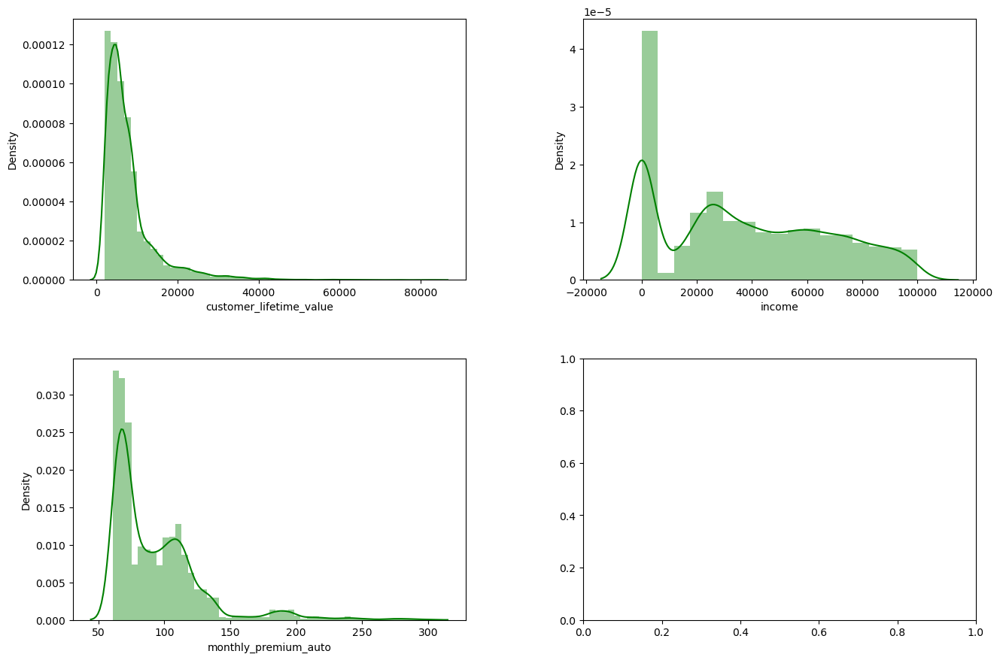

In [46]:
# determine the number of rows and columns in the plot grid
num_cols = 2  # number of columns in the grid
num_rows = (len(numericals_continuous_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
for i, column in enumerate(numericals_continuous_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.distplot(numericals_continuous_df[column], ax=axes[row_idx, col_idx], kde=True, color='green')
    axes[row_idx, col_idx].set_xlabel(column)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.show()

In [48]:
for column in numericals_continuous_df.columns:
    iqr = np.percentile(numericals_continuous_df[column],75) - np.percentile(numericals_continuous_df[column],25) # data['IC1'].quantile(0.75)
    iqr
    # define the limits
    upper_limit = np.percentile(numericals_continuous_df[column],75) + 1.5*iqr
    lower_limit = np.percentile(numericals_continuous_df[column],25) - 1.5*iqr
    print("\nFeature name: ", column," | Upper limit: ", upper_limit," | Lower limit: ", lower_limit)
    size_exclusion=len(numericals_df.loc[(numericals_continuous_df[column]>upper_limit) | (numericals_continuous_df[column]<lower_limit)])
    print("Number of exclusions would be ",size_exclusion)

    #Only numerical continuous have outliers?


Feature name:  customer_lifetime_value  | Upper limit:  16414.039911750002  | Lower limit:  -3457.6210762500014
Number of exclusions would be  817

Feature name:  income  | Upper limit:  155800.0  | Lower limit:  -93480.0
Number of exclusions would be  0

Feature name:  monthly_premium_auto  | Upper limit:  170.5  | Lower limit:  6.5
Number of exclusions would be  430


In [49]:
#Testing before function
print(customer_df.shape)
iqr = np.percentile(customer_df['customer_lifetime_value'],75) - np.percentile(customer_df['customer_lifetime_value'],25) 
upper_limit = np.percentile(customer_df['customer_lifetime_value'],75) + 1.5*iqr
lower_limit = np.percentile(customer_df['customer_lifetime_value'],25) - 1.5*iqr
customer_df_post = customer_df[(customer_df['customer_lifetime_value']>lower_limit)& (customer_df['customer_lifetime_value']<upper_limit)]
print(customer_df_post.shape)

(9134, 23)
(8317, 23)


> No removing outliers in total_claim_amount because it is the target.

In [50]:
#Function to remove outliers in numerical features. Is there outliers in the categorical values?
columns_to_clean=['customer_lifetime_value','monthly_premium_auto','number_of_policies']
customer_df_post=customer_df
def remove_outliers(df,elements):
    for x in elements:
        print(df.shape)
        iqr = np.percentile(df[x],75) - np.percentile(df[x],25) # data['IC1'].quantile(0.75)
        upper_limit = np.percentile(df[x],75) + 1.5*iqr
        lower_limit = np.percentile(df[x],25) - 1.5*iqr
        df = df[(df[x]>lower_limit)& (df[x]<upper_limit)]
        print(df.shape)
    return df

customer_df_no_outliers= remove_outliers(customer_df_post,columns_to_clean)      
#Not sure if when deleting some records the limits will change for the next feature from what I have in the previous results. 

(9134, 23)
(8317, 23)
(8317, 23)
(8016, 23)
(8016, 23)
(7617, 23)


In [51]:
7617-9134

-1517

>1517 Records have been deleted

In [52]:
customer_df_no_outliers.sample(5)

,effective_to_date,state,response,coverage,education,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,sales_channel,vehicle_class,vehicle_size,policy_level,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,total_claim_amount
8235,2011-01-14,Nevada,No,Extended,College,Unemployed,M,Suburban,Single,0,3,Personal Auto,Offer2,Agent,Four-Door Car,Medsize,L2,5739.823806,0,80,27,88,848.201438
4938,2011-01-09,Arizona,No,Extended,College,Employed,F,Rural,Married,0,1,Personal Auto,Offer2,Web,Four-Door Car,Small,L2,3906.669584,60230,98,13,91,8.129056
1475,2011-01-14,Oregon,No,Basic,High School or Below,Employed,F,Rural,Married,0,6,Special Auto,Offer2,Call Center,Two-Door Car,Medsize,L2,5678.046711,68671,70,30,49,8.076879
279,2011-02-23,Oregon,No,Extended,High School or Below,Employed,F,Suburban,Married,0,1,Personal Auto,Offer2,Branch,Two-Door Car,Medsize,L3,3652.532435,39679,92,2,85,641.388616
2442,2011-02-19,Arizona,No,Basic,College,Unemployed,F,Urban,Married,0,1,Personal Auto,Offer2,Agent,Four-Door Car,Medsize,L2,2280.386988,0,61,16,29,283.881697


## <span style="color:#7B241C"> 2</span>

In [53]:
copy_customer_df=customer_df_no_outliers

## <span style="color:#7B241C"> 3</span>

>Use of box cox to normalize the numerical continuous variables

In [98]:
#Split dataframe into numerical, categorical, date and target
numericals_continuous_df=copy_customer_df.select_dtypes(include=["float", "int"])
numericals_continuous_df=numericals_continuous_df.drop(columns=['months_since_last_claim','months_since_policy_inception','total_claim_amount'])

numericals_discrete_df=copy_customer_df[['months_since_last_claim','months_since_policy_inception','number_of_open_complaints','number_of_policies']]
numericals_discrete_df['number_of_open_complaints'] = numericals_discrete_df['number_of_open_complaints'].astype('float')
numericals_discrete_df['number_of_policies'] = numericals_discrete_df['number_of_policies'].astype('float')

categorical_df=copy_customer_df.select_dtypes(include=[object]) 
categorical_df=categorical_df.drop(columns=['number_of_open_complaints','number_of_policies'])

date_df=copy_customer_df.select_dtypes(include=["datetime"])

Target_df=copy_customer_df[['total_claim_amount']]#Dont Normalize or transform

>Logaritmic transformation is used due to the skweness to the left in the numerical continuous variables.

In [99]:
#Show the distributions in as a normal distribution. 
##There are different methods to do this transformation
#I use Log Transformation

def log_transfom_clean(x):
    x = np.log(x)
    if np.isfinite(x):
        return x
    else:
        return np.NAN # or with np.NAN to change it to the mean afterwards with .fillna()

for column in numericals_continuous_df.columns:
    numericals_continuous_df[column] = list(map(log_transfom_clean, numericals_continuous_df[column])) #Transformation
    numericals_continuous_df[column] = numericals_continuous_df[column].fillna(np.mean(numericals_continuous_df[column]))    #Clean NAN
    

After the normalization the features distribution looks like this

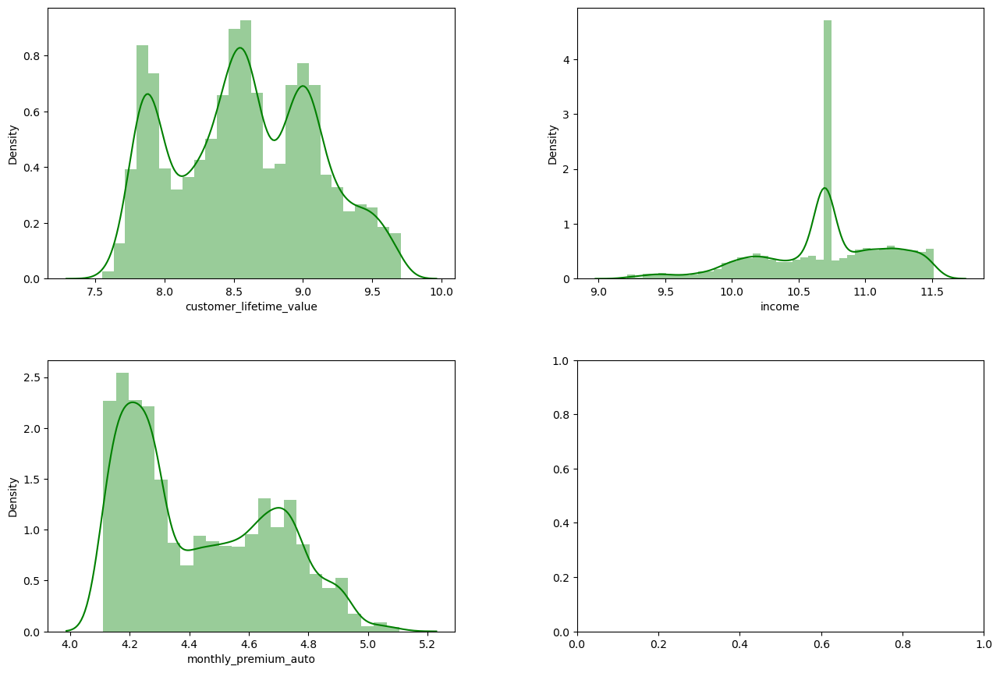

In [100]:
# determine the number of rows and columns in the plot grid
num_cols = 2  # number of columns in the grid
num_rows = (len(numericals_continuous_df.columns) + num_cols - 1) // num_cols  # number of rows in the grid

# create the plot grid and plot each distribution in a separate subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
for i, column in enumerate(numericals_continuous_df.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]
    sns.distplot(numericals_continuous_df[column], ax=axes[row_idx, col_idx], kde=True, color='green')
    axes[row_idx, col_idx].set_xlabel(column)

# adjust the spacing between subplots and show the figure
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.3)
plt.show()

## <span style="color:#7B241C"> 4</span>

Before encoding the categories are reduce. This is part from previous lab but I am doing it here. 
I have done it only with Policy before 

In [101]:
categorical_df=copy_customer_df.select_dtypes(include=[object]) 
categorical_df=categorical_df.drop(columns=['number_of_open_complaints','number_of_policies'])


In [102]:
#Clean the categorical variables and reduce the unique values before the encoding
#This code is taken from final round from unit 1

#Groupping EDUCATION. High, medium and low
categorical_df['education_simple'] = np.where(categorical_df['education'] == 'High School or Below' ,"LOW",categorical_df['education'])
categorical_df['education_simple'] = np.where(categorical_df['education_simple'] == 'College' ,"MEDIUM",categorical_df['education_simple'])
categorical_df['education_simple'] = np.where((categorical_df['education_simple'] == 'Bachelor') |(categorical_df['education_simple'] == 'Master') |(categorical_df['education_simple'] == 'Doctor') ,"HIGH",categorical_df['education_simple'])

#Groupping EMPLOYMENTSTATUS. I try to make bigger groups. employed. unemployed and other
categorical_df['employment_simple'] = np.where((categorical_df['employmentstatus'] == 'Medical Leave')|(categorical_df['employmentstatus'] == 'Disabled')| (categorical_df['employmentstatus'] == 'Retired'),"Other",categorical_df['employmentstatus'])

#Groupping VEHICLE_CLASS to diminish number of unique variables. Luxury. Sports Car. Four-Door Car includes SUV. Two-Door Car
categorical_df['vehicle_class_simple'] = np.where(categorical_df['vehicle_class'] == 'SUV',"Four-Door Car",categorical_df['vehicle_class'])
categorical_df['vehicle_class_simple'] = np.where((categorical_df['vehicle_class'] == 'Luxury SUV') | (categorical_df['vehicle_class'] == 'Luxury Car SUV'),"Luxury",categorical_df['vehicle_class_simple'])
categorical_df['vehicle_class_simple'] = np.where(categorical_df['vehicle_class'] == 'Sports Car',"Two-Door Car",categorical_df['vehicle_class'])

categorical_df=categorical_df.drop(columns=['education','employmentstatus','vehicle_class'])

In [103]:
categorical_df.head()

,state,response,coverage,gender,location_code,marital_status,policy_type,renew_offer_type,sales_channel,vehicle_size,policy_level,education_simple,employment_simple,vehicle_class_simple
0,Washington,No,Basic,F,Suburban,Married,Corporate Auto,Offer1,Agent,Medsize,L3,HIGH,Employed,Two-Door Car
1,Arizona,No,Extended,F,Suburban,Single,Personal Auto,Offer3,Agent,Medsize,L3,HIGH,Unemployed,Four-Door Car
2,Nevada,No,Premium,F,Suburban,Married,Personal Auto,Offer1,Agent,Medsize,L3,HIGH,Employed,Two-Door Car
3,California,No,Basic,M,Suburban,Married,Corporate Auto,Offer1,Call Center,Medsize,L2,HIGH,Unemployed,SUV
4,Washington,No,Basic,M,Rural,Single,Personal Auto,Offer1,Agent,Medsize,L1,HIGH,Employed,Four-Door Car


In [104]:
#Check unique values for each categorical value
for column in categorical_df.columns:
    print('─' * 10)
    print("This feature ", '\033[1m' + column + '\033[0m' ," has ", categorical_df[column].nunique(), " categories \n The single values are: ", categorical_df[column].unique(),"\n" )
    print("Here the detail: \n" , categorical_df[column].value_counts())
    print("\n\n")

──────────
This feature  state  has  5  categories 
 The single values are:  ['Washington' 'Arizona' 'Nevada' 'California' 'Oregon'] 

Here the detail: 
 California    2638
Oregon        2164
Arizona       1423
Nevada         738
Washington     654
Name: state, dtype: int64



──────────
This feature  response  has  2  categories 
 The single values are:  ['No' 'Yes'] 

Here the detail: 
 No     6531
Yes    1086
Name: response, dtype: int64



──────────
This feature  coverage  has  3  categories 
 The single values are:  ['Basic' 'Extended' 'Premium'] 

Here the detail: 
 Basic       4729
Extended    2309
Premium      579
Name: coverage, dtype: int64



──────────
This feature  gender  has  2  categories 
 The single values are:  ['F' 'M'] 

Here the detail: 
 F    3884
M    3733
Name: gender, dtype: int64



──────────
This feature  location_code  has  3  categories 
 The single values are:  ['Suburban' 'Rural' 'Urban'] 

Here the detail: 
 Suburban    4772
Rural       1497
Urban    

**ENCODE**

In [105]:
#Boolean variables
categorical_df['response_enc'] = np.where(categorical_df['response'] == 'Yes',1,0)
categorical_df['gender_enc'] = np.where(categorical_df['gender'] == 'F',1,0)

#ordinal variables
categorical_df['coverage_enc'] = categorical_df["coverage"].map({"Basic" : 0, "Extended" : 1, "Premium" : 2})
categorical_df['location_code_enc'] = categorical_df["location_code"].map({"Rural" : 0, "Suburban" : 1, "Urban" : 2})
categorical_df['vehicle_size_enc'] = categorical_df["vehicle_size"].map({"Small" : 0, "Medsize" : 1, "Large" : 2})
categorical_df['policy_level_enc'] = categorical_df["policy_level"].map({"L1" : 0, "L2" : 1, "L3" : 2})
categorical_df['education_simple_enc'] = categorical_df["education_simple"].map({"LOW" : 0, "MEDIUM" : 1, "HIGH" : 2})
categorical_df['employment_simple_enc'] = categorical_df["employment_simple"].map({"Unemployed" : 0, "Other" : 1, "Employed" : 2})

#Nominal variables (one hot)
categorical_df_enc=pd.get_dummies(categorical_df[['state','marital_status','policy_type','renew_offer_type','sales_channel','vehicle_class_simple']])

categorical_df=categorical_df.drop(columns=['response','gender','state','marital_status','policy_type','renew_offer_type','sales_channel','vehicle_class_simple','coverage','location_code','vehicle_size','policy_level','education_simple','employment_simple'])

categorical_df=pd.concat([categorical_df_enc,categorical_df],axis=1)
categorical_df = categorical_df.reset_index(drop=True)

In [106]:
categorical_df.head()

,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_Corporate Auto,policy_type_Personal Auto,policy_type_Special Auto,renew_offer_type_Offer1,renew_offer_type_Offer2,renew_offer_type_Offer3,renew_offer_type_Offer4,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_simple_Four-Door Car,vehicle_class_simple_SUV,vehicle_class_simple_Two-Door Car,response_enc,gender_enc,coverage_enc,location_code_enc,vehicle_size_enc,policy_level_enc,education_simple_enc,employment_simple_enc
0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,2,2,2
1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,1,1,1,2,2,0
2,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,1,2,1,1,2,2,2
3,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,1,2,0
4,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,2,2


## <span style="color:#7B241C"> 5</span>

In [107]:
#Get month, week and day
date_df['month']=date_df['effective_to_date'].dt.month
date_df['week']=date_df['effective_to_date'].dt.week
date_df['day']=date_df['effective_to_date'].dt.day
date_df=date_df.drop(columns=['effective_to_date'])

In [108]:
date_df.head()

,month,week,day
0,2,8,24
1,1,5,31
2,2,7,19
3,1,3,20
4,2,5,3


## <span style="color:#7B241C"> 6</span>

Join back all the partial dataframes and check consistency. 
All features should be numeric

In [109]:
prepared_customer_df=pd.concat([numericals_continuous_df,numericals_discrete_df,categorical_df,date_df,Target_df],axis=1)
prepared_customer_df = prepared_customer_df.reset_index(drop=True)

In [110]:
prepared_customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8890 entries, 0 to 8889
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   customer_lifetime_value             7617 non-null   float64
 1   income                              7617 non-null   float64
 2   monthly_premium_auto                7617 non-null   float64
 3   months_since_last_claim             7617 non-null   float64
 4   months_since_policy_inception       7617 non-null   float64
 5   number_of_open_complaints           7617 non-null   float64
 6   number_of_policies                  7617 non-null   float64
 7   state_Arizona                       7617 non-null   float64
 8   state_California                    7617 non-null   float64
 9   state_Nevada                        7617 non-null   float64
 10  state_Oregon                        7617 non-null   float64
 11  state_Washington                    7617 no

>Hurra all is float. Ready to run the model

In [111]:
prepared_customer_df.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_Corporate Auto,policy_type_Personal Auto,policy_type_Special Auto,renew_offer_type_Offer1,renew_offer_type_Offer2,renew_offer_type_Offer3,renew_offer_type_Offer4,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_simple_Four-Door Car,vehicle_class_simple_SUV,vehicle_class_simple_Two-Door Car,response_enc,gender_enc,coverage_enc,location_code_enc,vehicle_size_enc,policy_level_enc,education_simple_enc,employment_simple_enc,month,week,day,total_claim_amount
0,7.924260,10.937988,4.234107,32.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,2.0,2.0,2.0,2.0,8.0,24.0,384.811147
1,8.850738,10.695667,4.543295,13.0,42.0,0.0,8.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,1.0,5.0,31.0,1131.464935
2,9.464008,10.794809,4.682131,18.0,38.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,7.0,19.0,566.472247
3,8.941920,10.695667,4.663439,18.0,65.0,0.0,7.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,3.0,20.0,529.881344
4,7.942253,10.688211,4.290459,12.0,44.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,2.0,5.0,3.0,138.130879


In [ ]:
prepared_customer_df.to_csv('prepared_customer_data.csv', index=False)

## Solution 4.05
<div class="alert alert-block alert-danger">
<b>Alert:</b> Here is the lab | Comparing regression models

## <span style="color:#7B241C"> 1</span>
In this final lab, we will model our data. Import sklearn train_test_split and separate the data.
> Import libraries is done at the beginning of the document

In [3]:
#Import the data alredy prepared. This is done to avoid processing all the steps again
#Import data from the file 
customer_df=pd.read_csv('prepared_customer_data.csv',sep=",") # Paste here the path. 
customer_df.sample(10)

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_Corporate Auto,policy_type_Personal Auto,policy_type_Special Auto,renew_offer_type_Offer1,renew_offer_type_Offer2,renew_offer_type_Offer3,renew_offer_type_Offer4,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_simple_Four-Door Car,vehicle_class_simple_SUV,vehicle_class_simple_Two-Door Car,response_enc,gender_enc,coverage_enc,location_code_enc,vehicle_size_enc,policy_level_enc,education_simple_enc,employment_simple_enc,month,week,day,total_claim_amount
6952,7.743455,10.695667,4.204693,19.0,70.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,7.0,14.0,482.400000
7945,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,NaN,NaN,NaN,NaN
8068,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN
3775,7.665178,10.695667,4.110874,0.0,62.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,1.0,2.0,1.0,3.0,17.0,691.677138
8848,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,2.0,NaN,NaN,NaN,NaN
3132,8.638313,10.622376,4.276666,22.0,60.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,2.0,0.0,2.0,1.0,2.0,10.0,345.600000
7050,8.444899,11.497558,4.744932,8.0,22.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,8.0,25.0,552.000000
4548,7.812592,11.468942,4.110874,16.0,55.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,1.0,0.0,0.0,0.0,2.0,1.0,2.0,15.0,114.273025
5662,8.261952,10.245018,4.653960,18.0,50.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,3.0,20.0,701.708239
7264,8.781264,10.695667,4.510860,24.0,28.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,8.0,23.0,655.404481


> Why after importing I have nulls????? 

![FUCK](https://media.giphy.com/media/l0HlL6eH6eEew5FpS/giphy.gif "MECAGOENMIPUTAVIDA")


In [4]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8890 entries, 0 to 8889
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   customer_lifetime_value             7617 non-null   float64
 1   income                              7617 non-null   float64
 2   monthly_premium_auto                7617 non-null   float64
 3   months_since_last_claim             7617 non-null   float64
 4   months_since_policy_inception       7617 non-null   float64
 5   number_of_open_complaints           7617 non-null   float64
 6   number_of_policies                  7617 non-null   float64
 7   state_Arizona                       7617 non-null   float64
 8   state_California                    7617 non-null   float64
 9   state_Nevada                        7617 non-null   float64
 10  state_Oregon                        7617 non-null   float64
 11  state_Washington                    7617 no

>Removing nulls. it seems that the rows that contains nulls all the features are null I will just delete them. 

In [5]:
customer_df=customer_df.dropna().reset_index(drop=True)

In [6]:
#I have now 6344 records. Better this than to be dead. I will re-do the entire exercise for next time 
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6344 entries, 0 to 6343
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   customer_lifetime_value             6344 non-null   float64
 1   income                              6344 non-null   float64
 2   monthly_premium_auto                6344 non-null   float64
 3   months_since_last_claim             6344 non-null   float64
 4   months_since_policy_inception       6344 non-null   float64
 5   number_of_open_complaints           6344 non-null   float64
 6   number_of_policies                  6344 non-null   float64
 7   state_Arizona                       6344 non-null   float64
 8   state_California                    6344 non-null   float64
 9   state_Nevada                        6344 non-null   float64
 10  state_Oregon                        6344 non-null   float64
 11  state_Washington                    6344 no

In [30]:
X=customer_df.drop(columns=['total_claim_amount'])
Y=customer_df[['total_claim_amount']]

In [31]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=100)

## <span style="color:#7B241C"> 2</span>
Try a simple linear regression with all the data to see whether we are getting good results.

In [9]:
model = LinearRegression() # Assign model to a container/variable
model.fit(X_train,Y_train) #Apply model to train

#Test model
predictions  = model.predict(X_test) # get predictions with the trained model 
predictions.shape # Check the shape for the results in the model

(1904, 1)

In [12]:
# evaluating sklearn's LR model
r2 = r2_score(Y_test, predictions)
#RMSE = mean_squared_error(y_test, predictions, squared=False)
#MSE = mean_squared_error(y_test, predictions)
#print("r2 = ", r2)
#print("RMSE = ", RMSE)
#print("MSE = ", MSE)

MAE = mean_absolute_error(Y_test,predictions)
MSE = mean_squared_error(Y_test,predictions)
RMSE = np.sqrt(MSE)
R2 = r2_score(Y_test,predictions)

print("The mean absolute error of the model in the test set is: %6.2f" % (MAE))
#print("The mean absolute error of the model in the test set is: " , MAE)
print("The mean squared error of the model in the test set is: %6.2f" % (MSE))
print("The root mean squared error of the model in the test set is: %6.2f" % (RMSE))
print("The R2 of the model in the test set is: %4.2f" % (R2))

The mean absolute error of the model in the test set is: 145.54
The mean squared error of the model in the test set is: 41075.99
The root mean squared error of the model in the test set is: 202.67
The R2 of the model in the test set is: 0.25


## <span style="color:#7B241C"> 3</span>
Great! Now define a function that takes a list of models and train (and tests) them so we can try a lot of them without repeating code.

In [25]:
def Compare_models(dataframe,target_feature,model_list):
    #Separate Target
    X=customer_df.drop(columns=[target_feature])
    Y=customer_df[[target_feature]]
    
    #Split in train and test
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=100)
    
    #Apply model
    #Linear Regression
    lr_model = LinearRegression() # Assign model to a container/variable
    lr_model.fit(X_train,Y_train) #Apply model to train
    predictions  = lr_model.predict(X_test) # get predictions with the trained model 
    predictions.shape # Check the shape for the results in the model
    r2 = r2_score(Y_test, predictions)
    
    MAE = mean_absolute_error(Y_test,predictions)
    MSE = mean_squared_error(Y_test,predictions)
    RMSE = np.sqrt(MSE)
    R2 = r2_score(Y_test,predictions)
    
    print("\n Linear regression model results:")
    print("The mean absolute error of the model in the test set is: %6.2f" % (MAE))
    #print("The mean absolute error of the model in the test set is: " , MAE)
    print("The mean squared error of the model in the test set is: %6.2f" % (MSE))
    print("The root mean squared error of the model in the test set is: %6.2f" % (RMSE))
    print("The R2 of the model in the test set is: %4.2f" % (R2))
    
    #KNN Regression
    knn_model = KNeighborsRegressor(n_neighbors=4) # The keyword "n_neighbors" is what sets the K.
    knn_model.fit(X_train, Y_train)
    knn_predictions = knn_model.predict(X_test)
    MAE = mean_absolute_error(Y_test,knn_predictions)
    MSE = mean_squared_error(Y_test,knn_predictions)
    RMSE = np.sqrt(MSE)
    R2 = r2_score(Y_test,knn_predictions)
    
    print("\n KNN regression model results:")      
    print("The mean absolute error of the model in the test set is: %6.2f" % (MAE))
    print("The mean absolute error of the model in the test set is: " , MAE)
    print("The mean squared error of the model in the test set is: %6.2f" % (MSE))
    print("The root mean squared error of the model in the test set is: %6.2f" % (RMSE))
    print("The R2 of the model in the test set is: %4.2f" % (R2))
    

## <span style="color:#7B241C"> 4</span>
Use the function to check LinearRegressor and KNeighborsRegressor.

In [26]:
model_list=['LinearRegression','KNeighborsRegressor']
target_feature='total_claim_amount'

In [27]:
Compare_models(customer_df,target_feature,model_list)


 Linear regression model results:
The mean absolute error of the model in the test set is: 145.54
The mean squared error of the model in the test set is: 41075.99
The root mean squared error of the model in the test set is: 202.67
The R2 of the model in the test set is: 0.25

 KNN regression model results:
The mean absolute error of the model in the test set is: 191.13
The mean absolute error of the model in the test set is:  191.1338635516019
The mean squared error of the model in the test set is: 64258.79
The root mean squared error of the model in the test set is: 253.49
The R2 of the model in the test set is: -0.18


>Negative R2? what that even means?

## <span style="color:#7B241C"> 5</span>
You can check also the MLPRegressor for this task!

In [33]:
import sklearn.neural_network as neural_network
mlpr_model = neural_network.MLPRegressor() # Assign model to a container/variable
mlpr_model.fit(X_train,Y_train) #Apply model to train

#Test model
predictions  = mlpr_model.predict(X_test) # get predictions with the trained model 
predictions.shape # Check the shape for the results in the model

r2 = r2_score(Y_test, predictions)
MAE = mean_absolute_error(Y_test,predictions)
MSE = mean_squared_error(Y_test,predictions)
RMSE = np.sqrt(MSE)
R2 = r2_score(Y_test,predictions)

print("The mean absolute error of the model in the test set is: %6.2f" % (MAE))
print("The mean absolute error of the model in the test set is: " , MAE)
print("The mean squared error of the model in the test set is: %6.2f" % (MSE))
print("The root mean squared error of the model in the test set is: %6.2f" % (RMSE))
print("The R2 of the model in the test set is: %4.2f" % (R2))

The mean absolute error of the model in the test set is: 172.58
The mean absolute error of the model in the test set is:  172.58492150150292
The mean squared error of the model in the test set is: 51771.30
The root mean squared error of the model in the test set is: 227.53
The R2 of the model in the test set is: 0.05


>This is not a good result R2 is almost 0 

In [34]:
predictions

array([434.09686304, 427.52395629, 365.9417507 , ..., 391.04667424,
       363.66440706, 374.64164581])

In [36]:
results = pd.DataFrame()
results['Real_values'] = Y_test
results['pred'] = predictions
results['diff'] = results.apply(lambda x: abs(x['Real_values'] - x['pred']), axis=1)
results

,Real_values,pred,diff
6185,856.800000,434.096863,422.703137
2162,215.438825,427.523956,212.085131
3216,33.781673,365.941751,332.160078
781,460.323855,419.859971,40.463884
1436,124.933587,369.564017,244.630430
...,...,...,...
1815,336.000000,386.970646,50.970646
130,316.599228,370.746719,54.147491
1666,292.800000,391.046674,98.246674
2578,85.612463,363.664407,278.051944


>big errors can be seen in a random extract from this comparison table

In [37]:
results=results.sort_values(by=['diff'], ascending=False)
results

,Real_values,pred,diff
2878,1486.410662,445.140103,1041.270559
2248,1410.169290,442.093721,968.075569
4810,1430.548077,462.818296,967.729781
6010,1361.993232,415.053675,946.939557
3105,1380.107186,441.048189,939.058997
...,...,...,...
2458,436.800000,436.260636,0.539364
3029,406.348084,406.806514,0.458430
6264,412.800000,413.174533,0.374533
1066,371.802628,372.147260,0.344632


In [38]:
import plotly.express as px


In [39]:
fig = px.scatter(results['Real_values'], results['pred'])
fig.show()

## <span style="color:#7B241C"> 6</span>
Check and discuss the results.

> None of the models were good as predictors for Claim amount. 
The better was linear regression. 
KNN seems to be wrong. 
Neural network was extremely bad